# Mini Project

#Image Enhancement for selected poor quality images

### Libraries

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

##[1] Component Extraction from the following images

image Circle

In [14]:
def extract_and_enhance_circles(image_path):
    img = cv2.imread(image_path)
# grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gaussian Blur to smooth the image and reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Laplacian Edge Detection
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    laplacian_abs = cv2.convertScaleAbs(laplacian)

# CLAHE for better contrast
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced_gray = clahe.apply(gray)

# Circle Transform to detect circles
    circles = cv2.HoughCircles(
        blurred, cv2.HOUGH_GRADIENT, dp=1, minDist=20,
        param1=50, param2=30, minRadius=10, maxRadius=50
    )

    result = img.copy()
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:

            cv2.circle(result, (i[0], i[1]), i[2], (0, 255, 0), 2)

            cv2.circle(result, (i[0], i[1]), 2, (0, 0, 255), 3)


    plt.figure(figsize=(15, 10))
    plt.subplot(141), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(142), plt.imshow(laplacian_abs, cmap='gray'), plt.title('Laplacian Edge Detection')
    plt.subplot(143), plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)), plt.title('Detected Circles (Green & Red Centers)')
    plt.subplot(144), plt.imshow(enhanced_gray, cmap='gray'), plt.title('Contrast Enhanced (CLAHE)')
    plt.tight_layout()
    plt.show()

    return img, result

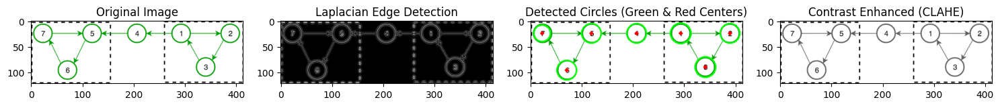

In [15]:
original_image, processed_image = extract_and_enhance_circles('/content/7 circles.png')

image COVID‐19 Chart

In [37]:
def extract_and_segment_components(image_path):
    img = cv2.imread(image_path)

    # Convert to grayscale for thresholding
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #Thresholding to isolate components
    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    #HSV for better color segmentation
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    #color ranges for different components
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([140, 255, 255])
    blue_mask = cv2.inRange(hsv, lower_blue, upper_blue)

    lower_green = np.array([40, 50, 50])
    upper_green = np.array([80, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    lower_orange = np.array([10, 100, 100])
    upper_orange = np.array([25, 255, 255])
    orange_mask = cv2.inRange(hsv, lower_orange, upper_orange)

    # Combine the masks for all components
    combined_mask = blue_mask + green_mask + orange_mask
    result = cv2.bitwise_and(img, img, mask=combined_mask)

    # ind contours for component extraction
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the image to draw contours
    contour_img = img.copy()
    cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)


    plt.figure(figsize=(15, 10))


    plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(232), plt.imshow(thresh, cmap='gray'), plt.title('Thresholded Image')


    plt.subplot(233), plt.imshow(blue_mask, cmap='gray'), plt.title('Blue Components')
    plt.subplot(234), plt.imshow(green_mask, cmap='gray'), plt.title('Green Components')
    plt.subplot(235), plt.imshow(orange_mask, cmap='gray'), plt.title('Orange Components')


    plt.subplot(236), plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB)), plt.title('Component Contours')

    plt.tight_layout()
    plt.show()

    return img, result, contour_img




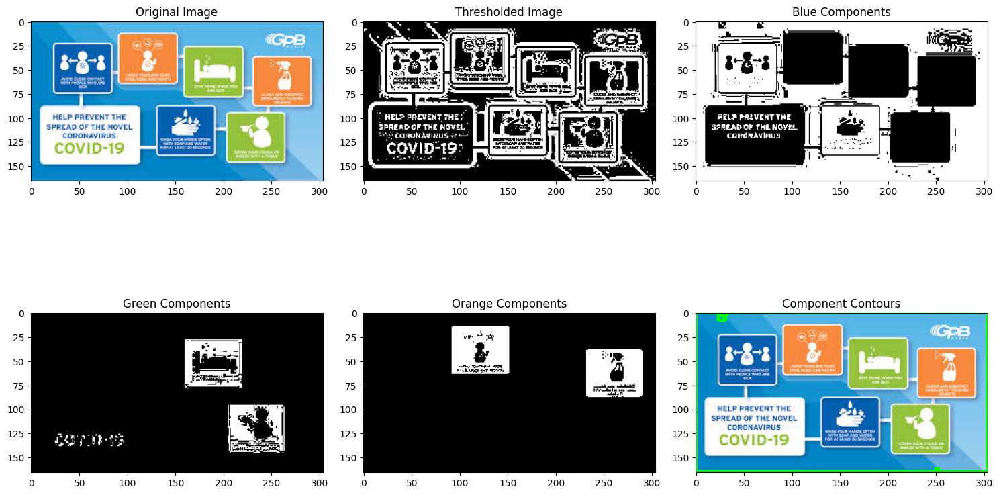

In [38]:
original_image, extracted_image, contours_image = extract_and_segment_components('/content/Multi_objects_separation.jpeg')


## [2] Enhancement of Blurry Images

image Building

In [52]:
# **Technique 1: Unsharp Masking**
# Create a Gaussian blurred version of the image to subtract from the original
def unsharp_masking(image_path):
    img = cv2.imread(image_path)
    gaussian_blur = cv2.GaussianBlur(img, (5, 5), 3)
    unsharp_masked = cv2.addWeighted(img, 1.5, gaussian_blur, -0.5, 0)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(unsharp_masked, cv2.COLOR_BGR2RGB))
    plt.title('Unsharp Masking Enhancement')
    plt.axis('off')
    plt.show()

    return unsharp_masked


In [53]:
# **Technique 2: Laplacian Sharpening**
# Laplacian Edge detection
def laplacian_sharpening(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    laplacian_abs = np.uint8(np.absolute(laplacian))
    laplacian_sharpened = cv2.addWeighted(gray, 1.5, laplacian_abs, -0.5, 0)

    plt.figure(figsize=(6, 6))
    plt.imshow(laplacian_sharpened, cmap='gray')
    plt.title('Laplacian Sharpening')
    plt.axis('off')
    plt.show()

    return laplacian_sharpened


In [54]:
# **Technique 3: Frequency Domain Filtering (High-Pass Filter)**
# Convert image to frequency domain using DFT
def frequency_domain_enhancement(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Convert image to frequency domain
    dft = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    rows, cols = gray.shape
    crow, ccol = rows // 2, cols // 2

    # Create high-pass filter mask
    mask = np.ones((rows, cols, 2), np.uint8)
    r = 30
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r * r
    mask[mask_area] = 0

    # Apply the mask and inverse transform
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])

    # Normalize for display
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

    plt.figure(figsize=(6, 6))
    plt.imshow(img_back, cmap='gray')
    plt.title('Frequency Domain Enhancement (High-Pass)')
    plt.axis('off')
    plt.show()

    return img_back


In [55]:
# **Technique 4: Edge Enhancement with Sobel Filter**
# Apply Sobel filter to detect edges and enhance them
def sobel_edge_enhancement(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_edge = cv2.magnitude(sobel_x, sobel_y)
    sobel_edge = np.uint8(cv2.normalize(sobel_edge, None, 0, 255, cv2.NORM_MINMAX))

    plt.figure(figsize=(6, 6))
    plt.imshow(sobel_edge, cmap='gray')
    plt.title('Sobel Edge Enhancement')
    plt.axis('off')
    plt.show()

    return sobel_edge


In [56]:
# **Technique 5: High-Resolution Sharpening**
# A more advanced sharpening method using high-pass filtering
def high_resolution_sharpening(image_path):
    img = cv2.imread(image_path)
    kernel = np.array([[-1, -1, -1], [-1,  9, -1], [-1, -1, -1]])  # High-pass kernel
    high_res_sharpened = cv2.filter2D(img, -1, kernel)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(high_res_sharpened, cv2.COLOR_BGR2RGB))
    plt.title('High-Resolution Sharpening')
    plt.axis('off')
    plt.show()

    return high_res_sharpened


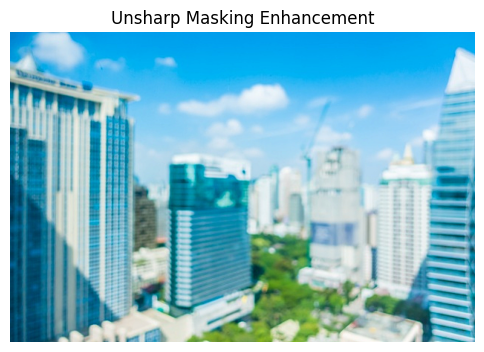

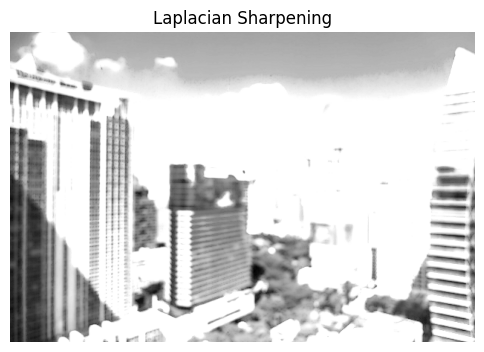

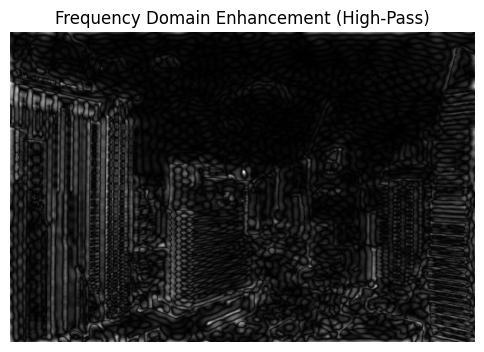

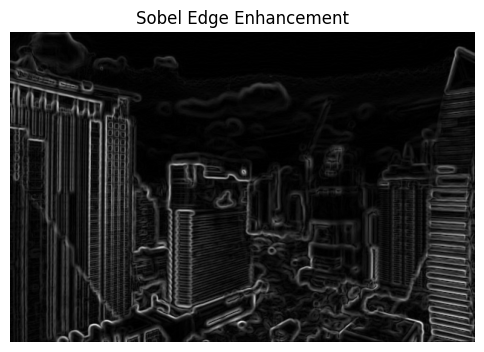

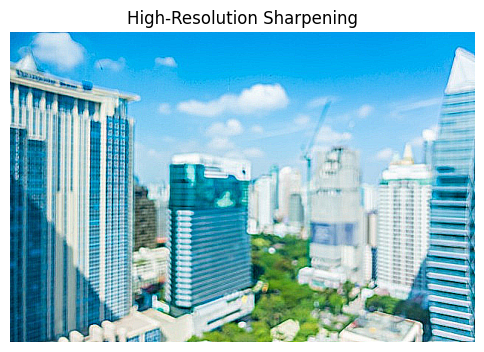

In [57]:
original_image = '/content/Building.jpg'

# Apply each enhancement method in separate cells
unsharp_image = unsharp_masking(original_image)
laplacian_image = laplacian_sharpening(original_image)
freq_domain_image = frequency_domain_enhancement(original_image)
sobel_edge_image = sobel_edge_enhancement(original_image)
high_res_image = high_resolution_sharpening(original_image)


Extra

In [79]:
def high_resolution_enhancement(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Apply custom sharpening kernel
    sharpen_kernel = np.array([[-1, -1, -1],
                               [-1,  9, -1],
                               [-1, -1, -1]])  # Sharpening kernel
    sharpened_image = cv2.filter2D(img, -1, sharpen_kernel)

    # Method 2: Apply Adaptive Histogram Equalization (AHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    ahe_image = clahe.apply(gray)

    # Method 3: High-resolution enhancement using Lanczos Interpolation
    height, width = img.shape[:2]
    new_width = width * 2  # Double the width
    new_height = height * 2  # Double the height
    high_res_image = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_LANCZOS4)


    plt.figure(figsize=(20, 5))

    plt.subplot(141), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(142), plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB)), plt.title('Custom Sharpening')
    plt.subplot(143), plt.imshow(ahe_image, cmap='gray'), plt.title('Adaptive Histogram Equalization (AHE)')
    plt.subplot(144), plt.imshow(cv2.cvtColor(high_res_image, cv2.COLOR_BGR2RGB)), plt.title('High-Resolution Image (Lanczos)')

    plt.tight_layout()
    plt.show()

    return sharpened_image, ahe_image, high_res_image




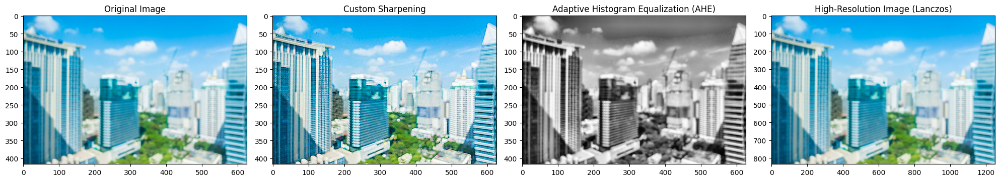

In [78]:
sharpened, ahe_enhanced, high_res = high_resolution_enhancement('/content/Building.jpg')

image Dog

In [75]:
def enhance_blurry_dog(image_path):
    img = cv2.imread(image_path)

    # Method 1: Unsharp Masking
    gaussian = cv2.GaussianBlur(img, (0, 0), 3)
    unsharp_masked = cv2.addWeighted(img, 1.5, gaussian, -0.5, 0)

    # Method 2: Custom Sharpening (Using sharpening kernel)
    kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])  # Sharpening Kernel
    sharpened_image = cv2.filter2D(img, -1, kernel)  # Applying custom sharpening filter


    plt.figure(figsize=(15, 5))

    plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')

    plt.subplot(132), plt.imshow(cv2.cvtColor(unsharp_masked, cv2.COLOR_BGR2RGB)), plt.title('Unsharp Masking')


    plt.subplot(133), plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB)), plt.title('Custom Sharpening')

    plt.tight_layout()
    plt.show()

    return sharpened_image

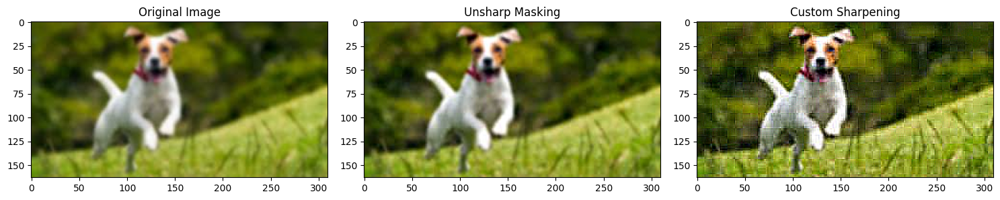

In [76]:
final_sharpened_dog = enhance_blurry_dog('/content/Dog.jpeg')

## [3] Noise removal from Noisy Images

image Text

In [86]:
def remove_noise_from_text_v2(image_path):
    img = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Median Filtering
    median_filtered = cv2.medianBlur(gray, 5)

    # Method 2: Gaussian Filtering
    gaussian_filtered = cv2.GaussianBlur(gray, (5, 5), 0)

    # Method 3: Non-Local Means Denoising
    nlm_filtered = cv2.fastNlMeansDenoising(gray, None, 30, 7, 21)

    # Display the results
    plt.figure(figsize=(15, 10))

    plt.subplot(141), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(142), plt.imshow(median_filtered, cmap='gray'), plt.title('Median Filtered')
    plt.subplot(143), plt.imshow(gaussian_filtered, cmap='gray'), plt.title('Gaussian Filtered')
    plt.subplot(144), plt.imshow(nlm_filtered, cmap='gray'), plt.title('Non-Local Means Denoising')

    plt.tight_layout()
    plt.show()

    return median_filtered, gaussian_filtered, nlm_filtered

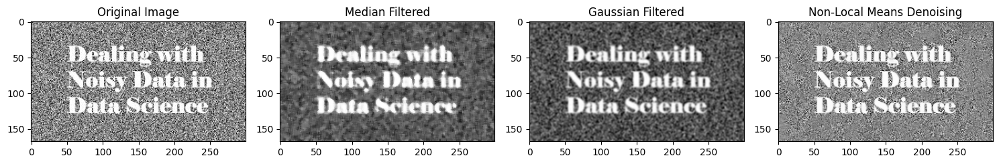

In [87]:
median, gaussian, bilateral = remove_noise_from_text_v2('/content/Text.jpeg')

image Rocket

In [93]:
def remove_noise_from_rocket(image_path):
    img = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Median Filtering
    median_filtered = cv2.medianBlur(gray, 5)

    # Method 2: Gaussian Filtering
    gaussian_filtered = cv2.GaussianBlur(gray, (5, 5), 0)

    # Method 3: Non-Local Means Denoising
    denoised_image = cv2.fastNlMeansDenoising(gray, None, 30, 7, 21)

    plt.figure(figsize=(20, 10))


    plt.subplot(1, 4, 1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(1, 4, 2), plt.imshow(median_filtered, cmap='gray'), plt.title('Median Filtered')
    plt.subplot(1, 4, 3), plt.imshow(gaussian_filtered, cmap='gray'), plt.title('Gaussian Filtered')
    plt.subplot(1, 4, 4), plt.imshow(denoised_image, cmap='gray'), plt.title('Non-Local Means Denoising')

    plt.tight_layout()
    plt.show()

    return median_filtered, gaussian_filtered, denoised_image

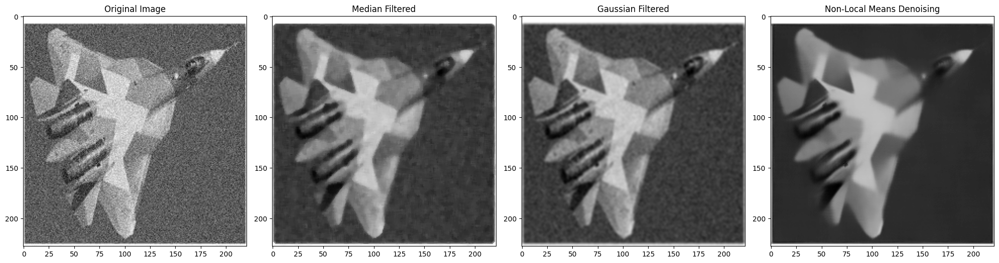

In [94]:
median_filtered, gaussian_filtered, denoised_image = remove_noise_from_rocket('/content/Rocket.jpeg')

image Wind Chart

In [101]:
def remove_noise_from_wind_chart(image_path):
    img = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Median Filtering
    median_filtered = cv2.medianBlur(gray, 5)

    # Method 2: Gaussian Filtering
    gaussian_filtered = cv2.GaussianBlur(gray, (5, 5), 0)

    # Method 3: Non-local Means Denoising
    denoised_image = cv2.fastNlMeansDenoising(gray, None, 10, 7, 21)

    # Method 4: Adaptive thresholding for better visualization
    adaptive_thresh = cv2.adaptiveThreshold(
        denoised_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY, 11, 2
    )

    plt.figure(figsize=(15, 12))

    plt.subplot(151), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(152), plt.imshow(median_filtered, cmap='gray'), plt.title('Median Filtered')
    plt.subplot(153), plt.imshow(gaussian_filtered, cmap='gray'), plt.title('Gaussian Filtered')
    plt.subplot(154), plt.imshow(denoised_image, cmap='gray'), plt.title('Non-Local Means Denoising')
    plt.subplot(155), plt.imshow(adaptive_thresh, cmap='gray'), plt.title('Adaptive Thresholding')

    plt.tight_layout()
    plt.show()

    return median_filtered, gaussian_filtered, denoised_image, adaptive_thresh

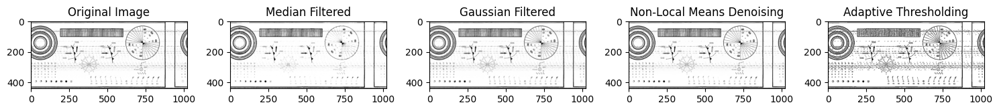

In [102]:
median_filtered, gaussian_filtered, denoised_image, adaptive_thresh = remove_noise_from_wind_chart('/content/Noisy_1.png')


## [4] Visual enhancement of the following images (Challenging Images)

image Newspaper

In [106]:
def enhance_newspaper_image(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Histogram Equalization for global contrast improvement
    hist_eq = cv2.equalizeHist(gray)

    # Method 2: Non-Local Means Denoising
    denoised_image = cv2.fastNlMeansDenoising(gray, None, 30, 7, 21)

    # Method 3: Sharpening
    sharpen_kernel = np.array([[-1, -1, -1],
                               [-1,  9, -1],
                               [-1, -1, -1]])
    sharpened_image = cv2.filter2D(img, -1, sharpen_kernel)

    # Method 4: CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(gray)

    # Method 5: Binarization (Thresholding)
    _, binarized_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)


    plt.figure(figsize=(15, 12))

    plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(232), plt.imshow(hist_eq, cmap='gray'), plt.title('Histogram Equalization')
    plt.subplot(233), plt.imshow(denoised_image, cmap='gray'), plt.title('Denoised Image')
    plt.subplot(234), plt.imshow(sharpened_image, cmap='gray'), plt.title('Sharpened Image')
    plt.subplot(235), plt.imshow(clahe_image, cmap='gray'), plt.title('CLAHE')
    plt.subplot(236), plt.imshow(binarized_image, cmap='gray'), plt.title('Binarized Image')

    plt.tight_layout()
    plt.show()

    return hist_eq, denoised_image, sharpened_image, clahe_image, binarized_image

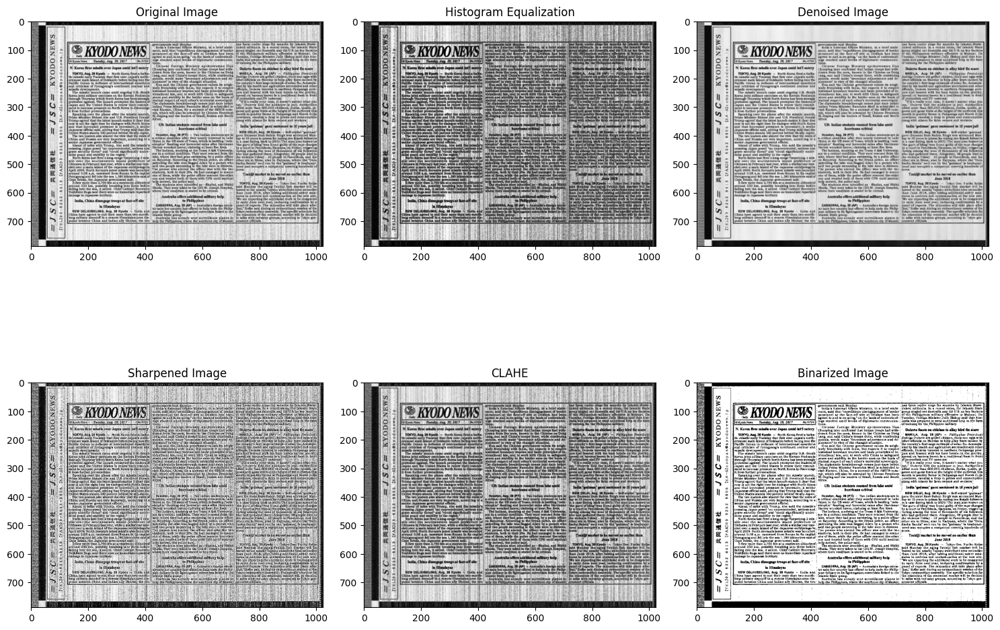

In [105]:
enhanced_images = enhance_newspaper_image('/content/Noisy_2.jpg')

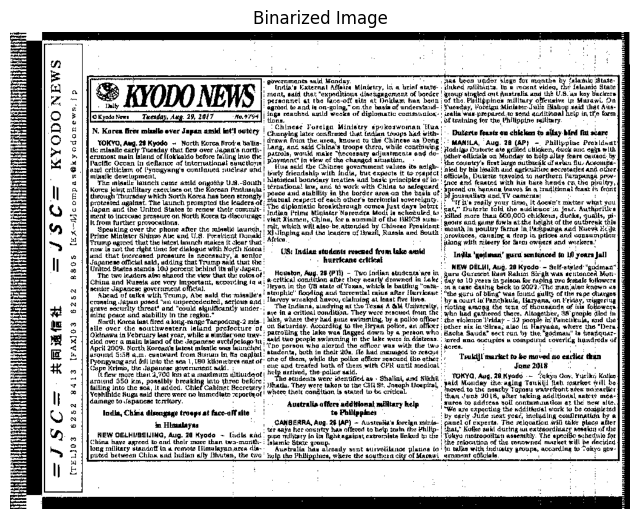

In [110]:
def binarize_image(image_path):
    # Read the image
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method: Binarization (Adaptive Thresholding)
    _, binarized_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)


    plt.figure(figsize=(8, 8))
    plt.imshow(binarized_image, cmap='gray')
    plt.title('Binarized Image')
    plt.axis('off')
    plt.show()


binarize_image('/content/Noisy_2.jpg')

image Name Plate

In [114]:
def enhance_nameplate_image(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Method 1: Histogram Equalization
    hist_equalized = cv2.equalizeHist(gray)

    # Method 2: CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(gray)

    # Method 3: Sharpening (Custom Kernel)
    sharpen_kernel = np.array([[-1, -1, -1],
                               [-1,  9, -1],
                               [-1, -1, -1]])
    sharpened_image = cv2.filter2D(img, -1, sharpen_kernel)

    # Method 4: Binarization (Adaptive Thresholding)
    _, binarized_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)


    plt.figure(figsize=(15, 10))

    plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')

    plt.subplot(232), plt.imshow(hist_equalized, cmap='gray'), plt.title('Histogram Equalization')

    plt.subplot(233), plt.imshow(clahe_image, cmap='gray'), plt.title('CLAHE')

    plt.subplot(234), plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB)), plt.title('Sharpened Image')

    plt.subplot(235), plt.imshow(binarized_image, cmap='gray'), plt.title('Binarized Image')

    plt.tight_layout()
    plt.show()


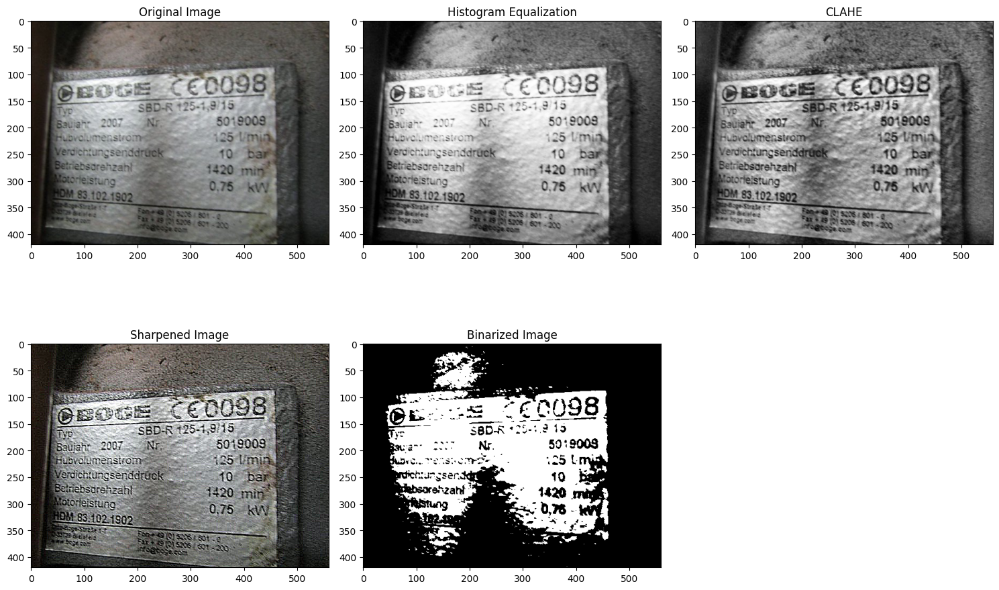

In [115]:
enhanced_images_nameplate = enhance_nameplate_image('/content/Name plate.jpg')

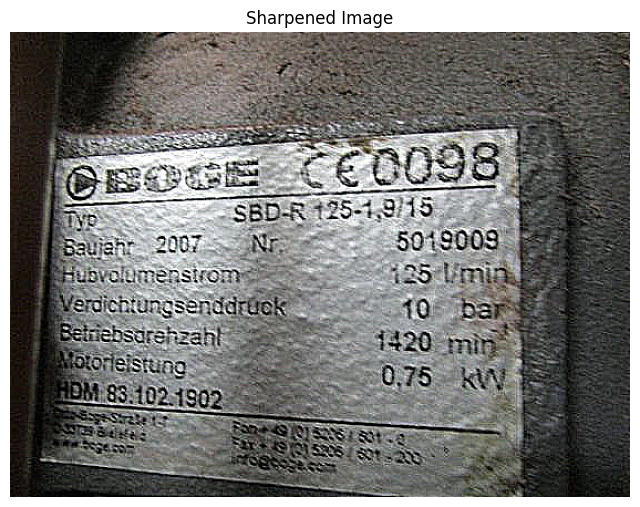

In [116]:
def sharpen_image(image_path):
    img = cv2.imread(image_path)

    # Sharpening kernel
    sharpen_kernel = np.array([[-1, -1, -1],
                               [-1,  9, -1],
                               [-1, -1, -1]])

    # Apply the sharpening filter
    sharpened_image = cv2.filter2D(img, -1, sharpen_kernel)


    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB))
    plt.title('Sharpened Image')
    plt.axis('off')
    plt.show()

sharpen_image('/content/Name plate.jpg')
